<a href="https://colab.research.google.com/github/terminate9298/Poetry-Generation-Models/blob/main/Song%20Lyrics%20Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
# !pip install torch --upgrade
# !conda install cudatoolkit -y  -c pytorch
# !conda install pytorch torchvision cudatoolkit=9.0 -y -c pytorch

import seaborn as sns
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import regex as re
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from tqdm import tqdm
import _pickle as cpickle
import random
import nltk
import math
import gensim
import datetime
import time , os
from sklearn.model_selection import GroupKFold
from keras.preprocessing.text import Tokenizer
tqdm.pandas()

# import PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
not_device = torch.device('cuda:0' if not torch.cuda.is_available() else "cpu")
sns.set_style("darkgrid")

BATCH_SIZE = 128
HIDDEN_SIZE = 128
EMBEDDING_SIZE = 300
EPOCHS = 1
CHAR_TOKEN = False
TOKEN_LIMIT = 20000
WINDOW_SIZE = 50
LIMIT = 60
UPDATE_EVERY = 200
SAVE_EVERY = 2000

# Filtering

In [ ]:
def clean(song):    
    # Contractions
    song = song.lower()
    song = re.sub(r"he's", "he is", song)
    song = re.sub(r"there's", "there is", song)
    song = re.sub(r"we're", "we are", song)
    song = re.sub(r"that's", "that is", song)
    song = re.sub(r"won't", "will not", song)
    song = re.sub(r"they're", "they are", song)
    song = re.sub(r"can't", "cannot", song)
    song = re.sub(r"wasn't", "was not", song)
    song = re.sub(r"aren't", "are not", song)
    song = re.sub(r"isn't", "is not", song)
    song = re.sub(r"what's", "what is", song)
    song = re.sub(r"haven't", "have not", song)
    song = re.sub(r"hasn't", "has not", song)
    song = re.sub(r"there's", "there is", song)
    song = re.sub(r"he's", "he is", song)
    song = re.sub(r"it's", "it is", song)
    song = re.sub(r"you're", "you are", song)
    song = re.sub(r"i'm", "i am", song)
    song = re.sub(r"shouldn't", "should not", song)
    song = re.sub(r"wouldn't", "would not", song)
    song = re.sub(r"i'm", "i am", song)
    song = re.sub(r"isn't", "is not", song)
    song = re.sub(r"here's", "here is", song)
    song = re.sub(r"you've", "you have", song)
    song = re.sub(r"we're", "we are", song)
    song = re.sub(r"what's", "what is", song)
    song = re.sub(r"couldn't", "could not", song)
    song = re.sub(r"we've", "we have", song)
    song = re.sub(r"who's", "who is", song)
    song = re.sub(r"y'all", "you all", song)
    song = re.sub(r"would've", "would have", song)
    song = re.sub(r"it'll", "it will", song)
    song = re.sub(r"we'll", "we will", song)
    song = re.sub(r"we've", "we have", song)
    song = re.sub(r"he'll", "he will", song)
    song = re.sub(r"y'all", "you all", song)
    song = re.sub(r"weren't", "were not", song)
    song = re.sub(r"didn't", "did not", song)
    song = re.sub(r"they'll", "they will", song)
    song = re.sub(r"they'd", "they would", song)
    song = re.sub(r"don't", "do n't", song)
    song = re.sub(r"they've", "they have", song)
    song = re.sub(r"i'd", "i would", song)
    song = re.sub(r"You\x89Ûªre", "You are", song)
    song = re.sub(r"where's", "where is", song)
    song = re.sub(r"we'd", "we would", song)
    song = re.sub(r"i'll", "i will", song)
    song = re.sub(r"weren't", "were not", song)
    song = re.sub(r"they're", "they are", song)
    song = re.sub(r"let's", "let us", song)
    song = re.sub(r"it's", "it is", song)
    song = re.sub(r"can't", "cannot", song)
    song = re.sub(r"don't", "do not", song)
    song = re.sub(r"you're", "you are", song)
    song = re.sub(r"i've", "I have", song)
    song = re.sub(r"that's", "that is", song)
    song = re.sub(r"i'll", "i will", song)
    song = re.sub(r"doesn't", "does not", song)
    song = re.sub(r"i'd", "i would", song)
    song = re.sub(r"didn't", "did not", song)
    song = re.sub(r"ain't", "am not", song)
    song = re.sub(r"you'll", "you will", song)
    song = re.sub(r"i've", "i have", song)
    song = re.sub(r"don't", "do not", song)
    song = re.sub(r"i'll", "i will", song)
    song = re.sub(r"i'd", "i would", song)
    song = re.sub(r"let's", "let us", song)
    song = re.sub(r"you'd", "you would", song)
    song = re.sub(r"it's", "it is", song)
    song = re.sub(r"ain't", "am not", song)
    song = re.sub(r"haven't", "have not", song)
    song = re.sub(r"could've", "could have", song)
    song = re.sub(r"youve", "you have", song)
    song = re.sub(r"ev'ry" , 'every' , song)
    song = re.sub(r"coz" , 'because' , song)
    song = re.sub(r"n\'t" , 'not' , song)
    song = re.sub(r"that'll", "that will" ,song)
    song = re.sub(r"-", "" ,song)
    song = re.sub(r"[\.]+" , " . ", song)
    song = re.sub(r"\[[\sa-z0-9:-]*\]" , " ",song)
    song = re.sub(r"\n\r\n", "\n\n", song)
    song = re.sub(r"\r\n", "\n\n", song)
    song = re.sub(r"\n\n\n\n", "\n\n", song)
    song = re.sub(r"\n\n\n", "\n\n", song)
    song = re.sub(r"\n", " ", song)
    song = re.sub(r"\n\n", " ", song)
    song = re.sub(r"â\x80\x98" , "'" , song)
    song = re.sub(r"â\x80\x99" , "'" , song)
    song = re.sub(r"â\x80¦" , "" , song)
    song = re.sub(r"'s'" , " " , song)
#     song = re.sub(r"\n\n", " <para> ", song)
#     song = re.sub(r"\([a-zA-Z0-9\s\W]*\)" , " ", song
#     song = re.sub(r"\n", " <line> ", song)
#     Words with punctuations and special characters
    punctuations = ',@#!?+&*-%./();$=|{}^' + "`"
    for p in punctuations:
        song = song.replace(p, f' {p} ')
#     remove_punctions = "'[]:?!()" + '"'
#     for p in remove_punctions:
#         song = song.replace(p , '')
    song = re.sub(r'[0-9]{3,}' , ' ### ' ,song)
    song = re.sub(r'[0-9]{2}' , ' ## ' ,song)
    song = re.sub(r'[0-9]{1}' , ' # ' ,song)
    
    song = re.sub(r'[^a-z<># ]','',song) # remove punctuations
    song = re.sub(r"[ ]+" , " " , song)
    return song

# Data Import and Preprocessing

In [ ]:
class lyricsClass:
    def __init__(self , lyrics_filename = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/Songs Lyrics/lyrics.csv' , \
                        guten_filename = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/Gutenberg Poetry Collection/Gutenberg-Poetry.csv',\
                        poki_filename = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/Poki/poki.csv',\
                        pf_filename = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/PF/poem_dataset.csv'):
        self.lyrics_filename = lyrics_filename
        self.guten_filename = guten_filename
        self.poki_filename = poki_filename
        self.pf_filename = pf_filename
        self.read_lyrics()
        self.clear_text()
        self.remove_rows()
#         self.create_dictionary()

    # Reading the Lyrics File
    def read_lyrics(self):
        self.lyrics = pd.read_csv(self.lyrics_filename)
        self.guten = pd.read_csv(self.guten_filename)
        self.guten = self.guten.groupby(['gid']).agg({'s' : lambda x : ' '.join(x)})
        self.poki = pd.read_csv(self.poki_filename)
        self.pf = pd.read_csv(self.pf_filename)

    # Display the Details
    def print_sample(self , size = 10):
        display(self.lyrics.sample(size))
        display(self.guten.sample(size))
        display(self.poki.sample(10))
        display(self.pf.sample(10))
        
    def remove_rows(self):
        self.lyrics = self.lyrics[self.lyrics.artist != 'Arijit Singh Lyrics']
        
    # Display Info 
    def print_info(self):
        display(self.lyrics.info())
        display(self.guten.info())
        display(self.poki.info())
        display(self.pf.info())
    
    def print_describe(self):
        display(self.lyrics.describe())
        display(self.guten.descibe())
        display(self.poki.describe())
        display(self.pf.describe())
    
    
    # Filtering the Text to New Column
    def clear_text(self):
        self.lyrics['clearLyrics'] = self.lyrics.lyrics.progress_apply(lambda x: clean(x))
        self.guten['clearSongs'] = self.guten.s.progress_apply(lambda x : clean(x))
        self.poki['clearText'] = self.poki.text.progress_apply(lambda x : clean(x))
        self.pf['clearContent'] = self.pf.Content.progress_apply(lambda x : clean(x))
    
    def create_dictionary(self):
        self.all_songs = []
        for row in self.lyrics.values:
            for rw in row[5].split(' <para> '):
                self.all_songs.append({'id': row[0] , 's': rw, 'len': len(rw)})
        self.all_songs = pd.DataFrame(self.all_songs)
        self.all_songs.drop_duplicates(subset=['s'] , inplace = True)
    
    def create_tokens(self):
        self.tokenizer = Tokenizer(num_words=TOKEN_LIMIT , filters='', char_level = CHAR_TOKEN, lower=False)
        self.tokenizer.fit_on_texts(self.lyrics['clearLyrics'].values.tolist())
        self.tokenizer.fit_on_texts(self.guten['clearSongs'].values.tolist())
        self.tokenizer.fit_on_texts(self.poki['clearText'].values.tolist())
        self.tokenizer.fit_on_texts(self.pf['clearContent'].values.tolist())
        self.lyrics['tokenLyrics'] = self.tokenizer.texts_to_sequences(self.lyrics.clearLyrics)
        self.guten['tokenSongs'] = self.tokenizer.texts_to_sequences(self.guten.clearSongs)
        self.poki['tokenText'] = self.tokenizer.texts_to_sequences(self.poki.clearText)
        self.pf['tokenContent'] = self.tokenizer.texts_to_sequences(self.pf.clearContent)
    
    def clear_lyrics(self):
        self.lyrics['len_token'] = self.lyrics.tokenLyrics.apply(lambda x : len(x))
        self.guten['len_token'] = self.guten.tokenSongs.apply(lambda x : len(x))
        self.poki['len_token'] = self.poki.tokenText.apply(lambda x : len(x))
        self.pf['len_token'] = self.pf.tokenContent.apply(lambda x : len(x))
    
    
    def remove_limits(self , limit = LIMIT):
        self.lyrics = self.lyrics[self.lyrics['len_token'] > limit]
        self.guten = self.guten[self.guten['len_token'] > limit]
        self.poki = self.poki[self.poki['len_token'] > limit]
        self.pf = self.pf[self.pf['len_token'] > limit]


    def word_count(self , count_f = [ 'Lyrics' , 'Poki','Guten' , 'PF']):
        self.freq = nltk.FreqDist()
        if 'Guten' in count_f:
            print('Counting Words for Gutenberg Courpus')
            for i in self.guten.clearSongs.values:
                for h in i.split():
                    self.freq[h] += 1
        if 'Lyrics' in count_f:
            print('Counting Words for Songs Lyrics')
            for i in self.lyrics.clearLyrics.values:
                for h in i.split():
                    self.freq[h] += 1
        if 'Poki' in count_f:
            print('Counting Words for Poki Poems')
            for i in self.poki.clearText.values:
                for h in i.split():
                    self.freq[h] += 1
        
        if 'PF' in count_f:
            print('Counting Words for PF Poems')
            for i in self.pf.clearContent.values:
                for h in i.split():
                    self.freq[h] += 1
        self.freq.plot(50)
        self.sorted_freq = nltk.FreqDist()
        for i , j  in sorted(self.freq.items(), key=lambda x: x[1], reverse=True):
            self.sorted_freq[i] = j
    
    def word_limits(self , limits = TOKEN_LIMIT):
        words = []
        words_count = 0
        total_count = 0
        first_time = True
        for i in self.sorted_freq:
            if len(words) < limits:
                words.append(i)
                words_count += self.sorted_freq[i]
                total_count += self.sorted_freq[i]
            else:
                if first_time:
                    print('Limit Reached \n Word : {} With Freq : {}'.format(i , self.sorted_freq[i]))
                    first_time = False
                total_count += self.sorted_freq[i]
        return words , words_count , total_count

100%|██████████| 15652/15652 [00:09<00:00, 1615.94it/s]


Counting Words for Gutenberg Courpus
Counting Words for Songs Lyrics
Counting Words for Poki Poems
Counting Words for PF Poems


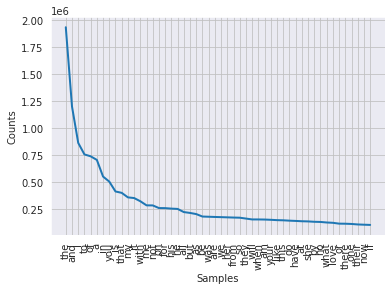

In [ ]:
lyrics = lyricsClass()
lyrics.word_count()

In [ ]:
words , words_count , total_count = lyrics.word_limits(20000)
print('Total Words {} \n\tWord Count : {} \n\tTotal Words : {} \n\t Coverage : {} %'.format(len(words) , words_count , total_count , (words_count/total_count)*100 ))


Limit Reached 
 Word : maturity With Freq : 68
Total Words 20000 
	Word Count : 35219222 
	Total Words : 37051579 
	 Coverage : 95.05457783594055 %


In [ ]:
%%time
lyrics.create_tokens()
lyrics.clear_lyrics()
lyrics.remove_limits()

CPU times: user 37.2 s, sys: 201 ms, total: 37.4 s
Wall time: 37.4 s


In [ ]:
X_train = np.concatenate([lyrics.guten.tokenSongs.values , lyrics.lyrics.tokenLyrics.values , lyrics.poki.tokenText.values , lyrics.pf.tokenContent.values])
X_train = np.array([np.array(x_t) for x_t in X_train])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  


In [ ]:
X_train.shape

(56049,)

In [ ]:
with open('/content/drive/MyDrive/Data Sets/Poetry Gen/data/X_train.pickle' , 'wb') as file:
    cpickle.dump(X_train , file)
with open('/content/drive/MyDrive/Data Sets/Poetry Gen/data/lyrics.pickle' , 'wb') as file:
    cpickle.dump(lyrics , file)
# del X_train , lyrics


# Training Gensium Model One Time

In [ ]:
import gensim

documents = []
documents += [x.split() for x in lyrics.lyrics['clearLyrics']]
documents += [x.split() for x in lyrics.guten['clearSongs']]
documents += [x.split() for x in lyrics.poki['clearText']]
documents += [x.split() for x in lyrics.pf['clearContent']]

W2V_SIZE = 300
W2V_WINDOW = 7
W2V_EPOCH = 50
W2V_MIN_COUNT = 10
w2v_model = gensim.models.word2vec.Word2Vec(size=W2V_SIZE, window=W2V_WINDOW, min_count=W2V_MIN_COUNT, workers=8)
w2v_model.build_vocab(documents)
words = w2v_model.wv.vocab.keys()
vocab_size = len(words)
print("Vocab size", vocab_size)

w2v_model.train(documents, total_examples=len(documents), epochs=W2V_EPOCH)
# w2v_model.most_similar("bitch")
w2v_model.save("/content/drive/MyDrive/Data Sets/Poetry Gen/word2vec.model")
w2v_model.wv.save_word2vec_format('/content/drive/MyDrive/Data Sets/Poetry Gen/word2vec.bin', binary=True)


In [ ]:
w2v_model = gensim.models.word2vec.Word2Vec.load('/content/drive/MyDrive/Data Sets/Poetry Gen/word2vec.model')

In [ ]:
embedding_matrix = np.zeros((min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1  , EMBEDDING_SIZE))
word_counter = 0
for word , i in lyrics.tokenizer.word_index.items():
    if word in w2v_model.wv:
        if i < embedding_matrix.shape[0]:
            word_counter += 1
            embedding_matrix[i] = w2v_model.wv[word]
print('Embedding Matrix Shape - > ', embedding_matrix.shape)
print('Number of Words found in Embedding Layers are' , word_counter)
print('The Ratio of words Found is ' , word_counter/embedding_matrix.shape[0])


Embedding Matrix Shape - >  (20001, 300)
Number of Words found in Embedding Layers are 20000
The Ratio of words Found is  0.999950002499875


In [ ]:
with open('/content/drive/MyDrive/Data Sets/Poetry Gen/data/embedding_matrix.pickle' , 'wb') as file:
    cpickle.dump(embedding_matrix , file)

In [ ]:
with open(r"/content/drive/MyDrive/Data Sets/Poetry Gen/data/lyrics.pickle", "rb") as input_file:
    lyrics = cpickle.load(input_file)
with open(r"/content/drive/MyDrive/Data Sets/Poetry Gen/data/X_train.pickle", "rb") as input_file:
    X_train = cpickle.load(input_file)
with open(r"//content/drive/MyDrive/Data Sets/Poetry Gen/data/embedding_matrix.pickle", "rb") as input_file:
    embedding_matrix = cpickle.load(input_file)

# Data Loader

In [ ]:
X_train = lyrics.poki.tokenText.values
X_train = np.array([np.array(x_t) for x_t in X_train])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  


In [ ]:
class Data_Loader:
    def __init__(self , Data , Window_Size = WINDOW_SIZE , Batch_Size = BATCH_SIZE , Dropouts = False , Dropout = 0.25):
        self.data = Data # Array Type (1-Dimension)
        self.ws = Window_Size #Default Window Size 
        self.bs = Batch_Size
        self.Dropouts = Dropouts
        self.Dropout = Dropout
    
    def create_shuffle_list(self):
        # Create a List of Shuffle Index of Data
        self.index = list(range(len(self.data)))
        random.shuffle(self.index)
    
    def return_data(self , idx , loc):
        if (loc + self.ws + 1) >= len(self.data[idx]):
            is_finish = True
        else:
            is_finish = False
        data = self.data[idx][loc: loc + self.ws]
        target = self.data[idx][ loc +1: loc+self.ws+1]
        if self.Dropouts:
            data = (np.random.rand(self.ws) > self.Dropout)*data
        return data , target , is_finish
    
    def create_minibatch(self):
        self.create_shuffle_list()
        mini_index = self.index[:self.bs]
        mini_bs = self.bs
        mini_loc = [0]*self.bs
        loop_until = True
        while True:
            mini_data = []
            mini_target = []
            mini_hidden = []
            for i in range(len(mini_index)):
                data , target , is_finish = self.return_data( mini_index[i] , mini_loc[i] )
                mini_data.append(data)
                mini_target.append(target)
                if is_finish:
                    mini_index[i] = self.index[mini_bs]
                    mini_bs += 1
                    mini_loc[i] = 0
                    mini_hidden.append(False)
                    if mini_bs >=len(self.data):
                        loop_until = False
                        break
                else:
                    mini_loc[i] +=1
                    mini_hidden.append(True)
            if loop_until: yield mini_data , mini_target , mini_hidden
            else: break
                
            if mini_bs >= len(self.data):
                break     

data_loader = Data_Loader(X_train)

# Model

### RNN Model

In [ ]:
# Process to Implement CrossEntropyLoss and NLLLoss Losses - https://jamesmccaffrey.wordpress.com/2020/10/01/the-pytorch-log_softmax-function/

class Char_RNN(nn.Module):
    def __init__(self , input_size , hidden_size , embedding_size , output_size , batch_size = BATCH_SIZE):
        super(Char_RNN, self).__init__()
        # Configs
        self.model_type = 'LSTM Model'
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.embedding_size = embedding_size
        self.num_layers = 3
        self.bidirectional = True
        self.f_d = (1 + self.bidirectional)*self.num_layers # Layers in First Dimenension
        self.batch_size = batch_size
        self.loss_ = []
        
        # Embedding Layers
        self.embedding = nn.Embedding(self.input_size , self.embedding_size)
        self.embedding.weight = nn.Parameter(torch.tensor(embedding_matrix , dtype = torch.float32))
        self.embedding.weight.requires_grad = False

        # LSTM Layers
        # self.lstm = nn.LSTM(input_size = self.hidden_size , hidden_size = self.hidden_size )
        self.lstm = nn.LSTM(input_size = self.embedding_size , hidden_size = self.hidden_size  , num_layers = self.num_layers , batch_first = True, bidirectional = self.bidirectional )
        
        # Linear Layer
        self.linear = nn.Linear((self.bidirectional +1)*self.hidden_size , self.output_size)
        
        # Activation Layer
        self.softmax = nn.LogSoftmax(dim=1)
    
    def forward(self , _input , _hidden , _state):
        length = _input.size()[0]
        _input = self.embedding(_input)
        _input , (_hidden , _state) = self.lstm(_input , (_hidden , _state))
#         _input = _input.contiguous().view(-1, self.hidden_size * (1+self.bidirectional))
        _input = self.linear(_input)
#         _input = _input.view(length, -1, self.output_size)
#         _input = _input[:, -1]
        return _input.transpose(1,2) , _hidden , _state
    
    def def_weights(self):
        hidden = Variable(torch.zeros(self.f_d  , self.batch_size , self.hidden_size)).to(device)
        cell = Variable(torch.zeros(self.f_d  , self.batch_size , self.hidden_size)).to(device)
        return hidden , cell


char_rnn = Char_RNN( input_size = min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1 , hidden_size = HIDDEN_SIZE , embedding_size = EMBEDDING_SIZE ,  output_size  = min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1 )
char_rnn = char_rnn.to(device)
# char_rnn.load_state_dict(torch.load('/content/drive/MyDrive/Data Sets/Poetry Gen/models/Char_RNN_T_Thu Feb 18 15:32:13 2021_L_0.16930843889713287_E_0_I_6000.pt'))
char_rnn

Char_RNN(
  (embedding): Embedding(20001, 300)
  (lstm): LSTM(300, 128, num_layers=3, batch_first=True, bidirectional=True)
  (linear): Linear(in_features=256, out_features=20001, bias=True)
  (softmax): LogSoftmax(dim=1)
)

In [ ]:
loss_ = []
def train(model , epochs):
    model.train()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    for epoch in range(epochs):
        hidden , cell = model.def_weights()
        itn = data_loader.create_minibatch()
        for i, (data , target , hidden_status) in enumerate(itn):
            data , target , hidden_status = torch.tensor(data) , torch.tensor(target) , torch.tensor(hidden_status * model.f_d).reshape(-1,1)
            data , target , hidden_status = data.to(device) , target.to(device) , hidden_status.to(device)
#             data , target , hidden_status = data.to(device, non_blocking=True) , target.to(device, non_blocking=True) , hidden_status.to(device, non_blocking=True)
            optimizer.zero_grad()
            output , hidden , cell = model(data , hidden , cell)
            loss = criterion(output , target)
            
            hidden = hidden.detach()
            cell = cell.detach()
            hidden = (hidden.reshape(-1, hidden.shape[2]) * hidden_status).reshape(-1,model.batch_size , model.hidden_size)
            cell = (cell.reshape(-1, cell.shape[2]) * hidden_status).reshape(-1,model.batch_size , model.hidden_size)
            
            loss.backward()
            optimizer.step()
            
            loss_.append(loss.item())
            if not (i%SAVE_EVERY):
                torch.save(model.state_dict() , '/content/drive/MyDrive/Data Sets/Poetry Gen/models/Char_RNN_T_{}_L_{}_E_{}_I_{}.pt'.format(str(time.ctime()),loss.item() , epoch , i))
            if not (i%UPDATE_EVERY):
                print('Epoch - {} Step - {} Loss - {}'.format(epoch , i , loss.item()))
        print('Completed Epoch : ',epoch)
        torch.save(char_rnn.state_dict(), '/content/drive/MyDrive/Data Sets/Poetry Gen/models/Char RNN {}.pt'.format(epoch))

train(char_rnn , EPOCHS )


Epoch - 0 Step - 0 Loss - 9.910762786865234
Epoch - 0 Step - 200 Loss - 5.891294002532959
Epoch - 0 Step - 400 Loss - 4.086644649505615
Epoch - 0 Step - 600 Loss - 2.7716639041900635
Epoch - 0 Step - 800 Loss - 2.0382730960845947
Epoch - 0 Step - 1000 Loss - 1.638311505317688
Epoch - 0 Step - 1200 Loss - 1.3836575746536255
Epoch - 0 Step - 1400 Loss - 1.169758677482605
Epoch - 0 Step - 1600 Loss - 1.0032848119735718
Epoch - 0 Step - 1800 Loss - 0.9709444642066956
Epoch - 0 Step - 2000 Loss - 0.8597317337989807


### Transformers Model

In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)


In [ ]:
class TransformersModel(nn.Module):
    def __init__(self  , ninp , nhead , nlayers , ntoken , nhid, dropout = 0.25):
        super(TransformersModel , self).__init__()
        self.model_type = 'Transformer Model'
        self.src_mask = None
        self.pos_encoder = PositionalEncoding(ninp , dropout)
        encoder_layer = nn.TransformerEncoderLayer(ninp , nhead , nhid , dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer , nlayers)
        self.encoder = nn.Embedding(ntoken , ninp)
        self.ninp = ninp
        self.decoder = nn.Linear(ninp , ntoken)
        self.nhid = nhid
    
    def init_weights(self):
        initrange = 0.1
        nn.init.uniform_(self.encoder.weight, -initrange, initrange)
        nn.init.zeros_(self.decoder.weight)
        nn.init.uniform_(self.decoder.weight, -initrange, initrange)
    
    def forward(self , src):
        src = self.encoder(src) * math.sqrt(self.ninp)
        src = self.pos_encoder(src)
        output = self.transformer_encoder(src , self.src_mask)
        output = self.decoder(output)
        return F.log_softmax(output , dim = -1)


In [ ]:
transformer = TransformersModel( ninp = 300 , nlayers = 3 , nhead = 4 , nhid = 512  ,  ntoken  = min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1)
transformer.init_weights()
transformer = transformer.to(device)
transformer

TransformersModel(
  (pos_encoder): PositionalEncoding(
    (dropout): Dropout(p=0.25, inplace=False)
  )
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0): TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): _LinearWithBias(in_features=300, out_features=300, bias=True)
        )
        (linear1): Linear(in_features=300, out_features=512, bias=True)
        (dropout): Dropout(p=0.25, inplace=False)
        (linear2): Linear(in_features=512, out_features=300, bias=True)
        (norm1): LayerNorm((300,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((300,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.25, inplace=False)
        (dropout2): Dropout(p=0.25, inplace=False)
      )
      (1): TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): _LinearWithBias(in_features=300, out_features=300, bias=True)
        )
        (linear1): Linear(in_featur

In [ ]:
loss_ = []
def train(model , epochs):
    model.train()
    criterion = nn.NLLLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    for epoch in range(epochs):
        itn = data_loader.create_minibatch()
        for i, (data , target , _) in enumerate(itn):
            data , target = torch.tensor(data) , torch.tensor(target)
            data , target = data.to(device) , target.to(device)
#             data , target , hidden_status = data.to(device, non_blocking=True) , target.to(device, non_blocking=True) , hidden_status.to(device, non_blocking=True)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output.transpose(1,2) , target)
            loss.backward()
            optimizer.step()
            
            loss_.append(loss.item())
            if not (i%SAVE_EVERY):
                torch.save(model.state_dict() , '/content/drive/MyDrive/Data Sets/Poetry Gen/models/Transformer_{}_E_{}_I_{}.pt'.format(loss.item() , epoch , i))
            if not (i%UPDATE_EVERY):
                print('Epoch - {} Step - {} Loss - {}'.format(epoch , i , loss.item()))
        print('Completed Epoch : ',epoch)
        torch.save(char_rnn.state_dict(), '/content/drive/MyDrive/Data Sets/Poetry Gen/models/Transformer {}.pt'.format(epoch))

train(transformer , EPOCHS )


Epoch - 0 Step - 0 Loss - 6.640100002288818


### RNN and Transformers


In [ ]:
# Process to Implement CrossEntropyLoss and NLLLoss Losses - https://jamesmccaffrey.wordpress.com/2020/10/01/the-pytorch-log_softmax-function/

class Char_RNN(nn.Module):
    def __init__(self , input_size , hidden_size , embedding_size , output_size , batch_size = BATCH_SIZE):
        super(Char_RNN, self).__init__()
        # Configs
        self.model_type = 'LSTM Model'
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.embedding_size = embedding_size
        self.num_layers = 3
        self.bidirectional = True
        self.f_d = (1 + self.bidirectional)*self.num_layers # Layers in First Dimenension
        self.batch_size = batch_size
        self.loss_ = []
        
        # Embedding Layers
        self.embedding = nn.Embedding(self.input_size , self.embedding_size)
        self.embedding.weight = nn.Parameter(torch.tensor(embedding_matrix , dtype = torch.float32))
        self.embedding.weight.requires_grad = False
        
        self.lstm = nn.LSTM(input_size = self.embedding_size , hidden_size = self.hidden_size  , num_layers = self.num_layers , batch_first = True, bidirectional = self.bidirectional )
        
        encoder_layer = nn.TransformerEncoderLayer(ninp , nhead , nhid , dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer , nlayers)
        
        self.linear = nn.Linear((self.bidirectional +1)*self.hidden_size , self.output_size)
    
    def forward(self , _input , _hidden , _state):
        length = _input.size()[0]
        _input = self.embedding(_input)
        _input , (_hidden , _state) = self.lstm(_input , (_hidden , _state))
        _input = self.linear(_input)
        return _input.transpose(1,2) , _hidden , _state
    
    def def_weights(self):
        hidden = Variable(torch.zeros(self.f_d  , self.batch_size , self.hidden_size)).to(device)
        cell = Variable(torch.zeros(self.f_d  , self.batch_size , self.hidden_size)).to(device)
        return hidden , cell


char_rnn = Char_RNN( input_size = min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1 , hidden_size = HIDDEN_SIZE , embedding_size = EMBEDDING_SIZE ,  output_size  = min(len(lyrics.tokenizer.index_word.keys()) , TOKEN_LIMIT) + 1 )
char_rnn = char_rnn.to(device)
# char_rnn.load_state_dict(torch.load('/content/drive/MyDrive/Data Sets/Poetry Gen/models/Char_RNN_T_Thu Feb 18 15:32:13 2021_L_0.16930843889713287_E_0_I_6000.pt'))
char_rnn

# Training Function

# Evaluation

In [ ]:
def evaluation(model , sentence = 'And This Poem Sucks Its Not Working and prediction same this' , predict_limit = 100):
    #Choose Only First 50 Characters in Sentence
    model.eval()
    # if len(sentence.split()) < WINDOW_SIZE:
    #     raise Exception("Sorry, length is Lesser than 50...") 
    sentence = lyrics.tokenizer.texts_to_sequences([sentence.lower()])
    sentence = [sentence[0][:WINDOW_SIZE]]
    sentence = torch.tensor(sentence).to(device)
    predict = sentence.squeeze(0)
    if model.model_type != 'Transformer Model':
        hidden = Variable(torch.zeros(model.f_d  , 1 , model.hidden_size)).to(device)
        cell = Variable(torch.zeros(model.f_d  , 1 , model.hidden_size)).to(device)
        for i in range(predict_limit):
            output , hidden , cell = model(sentence , hidden ,cell )
            # print(output.shape)
            res = torch.topk(output.squeeze(0)[-1],1).indices
            # print(res.shape , '\n' , sentence[:,1:].shape )

            sentence = torch.cat((sentence.squeeze(0)[1:] , res)).unsqueeze(0)
            predict = torch.cat((predict,res))
    else:
        for i in range(predict_limit):
            output = model(sentence)
            res = torch.topk(output.squeeze(0)[-1],1).indices
            sentence = torch.cat((sentence.squeeze(0)[1:] , res)).unsqueeze(0)
            predict = torch.cat((predict,res))
    return predict.cpu().numpy()

eval_result = evaluation(char_rnn)
display(lyrics.tokenizer.sequences_to_texts([eval_result])[0])

'and this poem sucks its not working and prediction same this and the that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that that'

In [ ]:
# eval_result

In [ ]:
initial_hidden = torch.randn(4 , 256 , 100)
status = torch.tensor([True, False , False , True] * 64 * 4) # 4*  64 * 4 = 256 * 4 = 1024
print('Initial Shapes : \n\tHidden Shape {} \n\tStatus Shape {}'.format(initial_hidden.shape , status.shape))

hidden = initial_hidden.reshape(-1 , initial_hidden.shape[2])
status = status.reshape(-1,1)
print('\nCompitable Shapes : \n\tHidden Shape {} \n\tStatus Shape {}'.format(hidden.shape , status.shape))

hidden = hidden * status
print('\nAfter Calculation Shapes : \n\tHidden Shape {} \n\tStatus Shape {}'.format(hidden.shape , status.shape))

hidden = hidden.reshape(-1,256,100)
status = status.reshape(-1) # Not Important
print('\nFinal Shapes : \n\tHidden Shape {} \n\tStatus Shape {}'.format(hidden.shape , status.shape))
print('\n\nInital Hidden Values : \n\t{}'.format(initial_hidden[0]))
print('\nFinal Hidden Values : \n\t{}'.format(hidden[0]))

# UseLess Code

### Download and Expolred Poki 

In [ ]:
!pip install wget
import wget
!pip install ebooklib
import ebooklib 
from ebooklib import epub
from bs4 import BeautifulSoup

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=f51f6782d36326746605be4aaa43b00b99a302efcf60b40094a8aad61a6572b9
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [ ]:
wget.download('https://github.com/whipson/PoKi-Poems-by-Kids/blob/master/poki.csv?raw=true' , out = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/Poki/poki.csv')
wget.download('https://github.com/vgrangep/poem_generator/blob/master/poem_dataset.csv?raw=true' , out = '/content/drive/MyDrive/Data Sets/Poetry Gen/data/PF/')
wget.download('https://bunker2.zlibcdn.com/dtoken/9b0244ed852455b8f0a7996dc56f3348') #Love Her Wild Poems by Atticus

'/content/drive/MyDrive/Data Sets/Poetry Gen/data/Poki/poki.csv'

'Love Her Wild Poems by Atticus (z-lib.org).epub'

In [ ]:
def epub2thtml(epub_path):    
    book = epub.read_epub(epub_path)    
    chapters = []    
    for item in book.get_items():        
        if item.get_type() == ebooklib.ITEM_DOCUMENT:            
            chapters.append(item.get_content())    
    return chapters
blacklist = [   '[document]',   'noscript', 'header',   'html', 'meta', 'head','input', 'script',   ]
# there may be more elements you don't want, such as "style", etc.
def chap2text(chap):    
    output = ''    
    soup = BeautifulSoup(chap, 'html.parser')    
    text = soup.find_all(text=True)    
    for t in text:        
        if t.parent.name not in blacklist:            
            output += '{} '.format(t)    
    return output

def thtml2ttext(thtml):    
    Output = []    
    for html in thtml:        
        text =  chap2text(html)        
        Output.append(text)    
    return Output

def extract_rober_frost(chap):
    poems = []
    for  poem in chap.find_all('div' ,class_ ='poem'):
        poems.append( poem.text)
    return poems

def call_robert_frost(chapters):
    output = []
    for chap in chapters:
        output.append(extract_rober_frost(BeautifulSoup(chap , 'html.parser')))
    return output

In [ ]:
chapters = epub2thtml('/content/drive/MyDrive/Data Sets/Poetry Gen/data/EPUB/Love Her Wild Poems by Atticus (z-lib.org).epub')
output = thtml2ttext(chapters)
output = output[4:-4]
output = pd.DataFrame(output , columns = ['poems'])
output['clear'] = output.poems.apply(clean)
output['len'] = output.clear.apply(lambda x: len(x.split(' ')))
output = output[output.len >10].reset_index(drop = True)
output.to_csv('/content/drive/MyDrive/Data Sets/Poetry Gen/data/EPUB/love_her_wild.csv')

In [ ]:
chapters = epub2thtml('/content/drive/MyDrive/Data Sets/Poetry Gen/data/EPUB/Complete Poems of Robert Frost by Robert Frost (z-lib.org).epub')
output = call_robert_frost(chapters[5:])
poems = []
for out in output:
    for ou in out:
        poems.append(ou)
poems = pd.DataFrame(poems, columns = ['Poems'])
poems['clear'] = poems.Poems.apply(clean)
poems['len'] = poems.clear.apply(lambda x: len(x.split(' ')))
poems.to_csv('/content/drive/MyDrive/Data Sets/Poetry Gen/data/EPUB/robert_frost.csv')

[b'<?xml version=\'1.0\' encoding=\'utf-8\'?>\n<!DOCTYPE html>\n<html xmlns="http://www.w3.org/1999/xhtml" xmlns:epub="http://www.idpf.org/2007/ops" epub:prefix="z3998: http://www.daisy.org/z3998/2012/vocab/structure/#" lang="en" xml:lang="en">\n  <head/>\n  <body>\n    <div>\n<img src="cover.jpg" alt="cover"/>\n</div>\n  </body>\n</html>\n',
 b'<?xml version=\'1.0\' encoding=\'utf-8\'?>\n<!DOCTYPE html>\n<html xmlns="http://www.w3.org/1999/xhtml" xmlns:epub="http://www.idpf.org/2007/ops" epub:prefix="z3998: http://www.daisy.org/z3998/2012/vocab/structure/#" lang="en" xml:lang="en">\n  <head/>\n  <body><div>\n            <svg xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" version="1.1" width="100%" height="100%" viewbox="0 0 449 751" preserveaspectratio="none">\n                <image width="449" height="751" xlink:href="cover.jpeg"/>\n            </svg>\n        </div>\n    </body>\n</html>\n',
 b'<?xml version=\'1.0\' encoding=\'utf-8\'?>\n<!DOCTYPE htm

,Poems,clear,len
0,\n\nI’m going out to clean the pasture spring;...,im going out to clean the pasture spring ill ...,68
1,"\n\nOne of my wishes is that those dark trees,...",one of my wishes is that those dark trees so ...,124
2,\n\nI dwell in a lonely house I know\nThat van...,i dwell in a lonely house i know that vanishe...,221
3,"\n\nMy Sorrow, when she’s here with me,\nThink...",my sorrow when shes here with me thinks these...,132
4,"\n\nA Stranger came to the door at eve,\nAnd h...",a stranger came to the door at eve and he spo...,212
...,...,...,...
328,"\n\nBut outer Space,\nAt least this far,\nFor ...",but outer space at least this far for all the...,21
329,\n\nBreathes there a bard who isn’t moved\nWhe...,breathes there a bard who isnt moved when he ...,26
330,\n\nWe vainly wrestle with the blind belief\nT...,we vainly wrestle with the blind belief that ...,24
331,\n\nIt takes all sorts of in- and outdoor scho...,it takes all sorts of in and outdoor schoolin...,19


In [ ]:
with open('sample.txt','w') as file_put:
    file_put.write(str(chapters[-5]))
    # file_put.write(str(BeautifulSoup(chapters[-5] , 'html.parser')))


In [ ]:
BeautifulSoup(chapters[5] , 'html.parser')

<?xml version='1.0' encoding='utf-8'?>
<!DOCTYPE html>

<html epub:prefix="z3998: http://www.daisy.org/z3998/2012/vocab/structure/#" lang="en" xml:lang="en" xmlns="http://www.w3.org/1999/xhtml" xmlns:epub="http://www.idpf.org/2007/ops">
<head></head>
<body><h3 class="poem-title">The Pasture</h3>
<div class="poem">
<div class="stanza">
<div class="poemline">I’m going out to clean the pasture spring;</div>
<div class="poemline">I’ll only stop to rake the leaves away</div>
<div class="poemline">(And wait to watch the water clear, I may)</div>
<div class="poemline">I sha’n’t be gone long.—You come too.</div>
</div>
<div class="stanza">
<div class="poemline">I’m going out to fetch the little calf</div>
<div class="poemline">That’s standing by the mother. It’s so young</div>
<div class="poemline">It totters when she licks it with her tongue.</div>
<div class="poemline">I sha’n’t be gone long.—You come too.</div>
</div>
</div>
</body>
</html>

In [ ]:
<h2[\w\d\<\>\"\_\= ,';]*<\/h2>